#### Data Prepration : English to Nepali translation

In [ ]:
!pip install googletrans==3.1.0a0

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 48.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 4.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 7.2 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-3.1.0a0-py3-none-any.whl size=16352 sha256=034305f2d5565a383e4f886eb700c5e103361039a36c6d6f1e4f348521499fa6
  Stored in directory: /root/.cache/pip/wheels/50/5d/3c/8477d0af4ca2b8b1308812c09f1930863caeebc762fe265a95
Successfully built googletrans


In [ ]:
import os
import googletrans
from googletrans import Translator
import string
import nltk
import pickle
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2

In [ ]:
# Load data from drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!unzip /content/drive/MyDrive/video_cap/YouTubeClips.zip -d /content/drive/MyDrive/video_cap/

Archive:  /content/drive/MyDrive/video_cap/YouTubeClips.zip
   creating: /content/drive/MyDrive/video_cap/YouTubeClips/
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-4wsuPCjDBc_5_15.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-7KMZQEsJW4_205_208.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-9CUm-2cui8_39_44.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_aaMGK6GGw_57_61.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_18_25.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_19_25.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_19_26.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_211_219.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_269_275.avi  
  inflating: /content/drive/MyDrive/video_cap/YouTubeClips/-_hbPLsZvvo_43_55.avi  
  inflating: /content/drive/MyDrive/video_cap

In [ ]:
# Paths
VIDEO_PATH = '/content/drive/MyDrive/video_cap/YouTubeClips/'
CAP_PATH = '/content/drive/MyDrive/video_cap/'
FRAMES_PATH = '/content/drive/MyDrive/video_cap/frames_output/'

In [ ]:
# Data frame
df = pd.read_csv(CAP_PATH+'videocorpus.csv')
df.columns = ['original_text','video_id','eng_captions']
print(df.shape)
df.head(5)

(80826, 3)


,original_text,video_id,eng_captions
0,-4wsuPCjDBc_5_15 a chipmunk is eating,-4wsuPCjDBc_5_15,a chipmunk is eating
1,-4wsuPCjDBc_5_15 a chipmunk is eating a peanut,-4wsuPCjDBc_5_15,a chipmunk is eating a peanut
2,-4wsuPCjDBc_5_15 a chipmunk is eating a nut,-4wsuPCjDBc_5_15,a chipmunk is eating a nut
3,-4wsuPCjDBc_5_15 a squirrel is eating a nut,-4wsuPCjDBc_5_15,a squirrel is eating a nut
4,-4wsuPCjDBc_5_15 a squirrel is eating a whole ...,-4wsuPCjDBc_5_15,a squirrel is eating a whole peanut


In [ ]:
# Initialize the translator
translator = Translator()

# Create an empty column for translated captions
df['nepali_captions'] = ''

# Iterate over each row in the dataframe
for index, row in df.iterrows():
    # Get the caption from the 'eng_captions' column
    caption = row['eng_captions']

    # Translate the caption to the desired language
    result = translator.translate(caption, src='en',dest='ne')
    translated_caption = result.text

    # Add the translated caption to the 'translated_captions' column
    df.at[index, 'nepali_captions'] = translated_caption
    print(index)

# Save the updated dataframe to a new CSV file
df.to_csv(CAP_PATH+'translated_nep_captions.csv', index=False)

Streaming output truncated to the last 5000 lines.
75826
75827
75828
75829
75830
75831
75832
75833
75834
75835
75836
75837
75838
75839
75840
75841
75842
75843
75844
75845
75846
75847
75848
75849
75850
75851
75852
75853
75854
75855
75856
75857
75858
75859
75860
75861
75862
75863
75864
75865
75866
75867
75868
75869
75870
75871
75872
75873
75874
75875
75876
75877
75878
75879
75880
75881
75882
75883
75884
75885
75886
75887
75888
75889
75890
75891
75892
75893
75894
75895
75896
75897
75898
75899
75900
75901
75902
75903
75904
75905
75906
75907
75908
75909
75910
75911
75912
75913
75914
75915
75916
75917
75918
75919
75920
75921
75922
75923
75924
75925
75926
75927
75928
75929
75930
75931
75932
75933
75934
75935
75936
75937
75938
75939
75940
75941
75942
75943
75944
75945
75946
75947
75948
75949
75950
75951
75952
75953
75954
75955
75956
75957
75958
75959
75960
75961
75962
75963
75964
75965
75966
75967
75968
75969
75970
75971
75972
75973
75974
75975
75976
75977
75978
75979
75980
75981
75982
75983
7

In [ ]:
review = pd.read_csv(CAP_PATH+'translated_nep_captions.csv')
review.tail(5)

,original_text,video_id,eng_captions,nepali_captions
80821,zzit5b_-ukg_5_20 a boy is excersizing,zzit5b_-ukg_5_20,a boy is excersizing,एक केटा व्यायाम गर्दैछ
80822,zzit5b_-ukg_5_20 a child play with a machine,zzit5b_-ukg_5_20,a child play with a machine,बच्चा मेसिनसँग खेल्दै
80823,zzit5b_-ukg_5_20 a boy playing their,zzit5b_-ukg_5_20,a boy playing their,एक केटा आफ्नो खेल्दै
80824,zzit5b_-ukg_5_20 a young child is using an exe...,zzit5b_-ukg_5_20,a young child is using an exercise machine,एक जवान बच्चा एक व्यायाम मेसिन प्रयोग गर्दैछ
80825,zzit5b_-ukg_5_20 the boy is exercising,zzit5b_-ukg_5_20,the boy is exercising,केटा व्यायाम गर्दैछ


In [ ]:
# Specify the column name to be modified
column_name = 'nepali_captions'

# Replace the word in the specified column
df[column_name] = df[column_name].str.replace('chipmunk', 'चिपमङ्कले')

# Save the modified dataframe to a new CSV file
df.to_csv(CAP_PATH+'nepali_captions.csv', index=False)

In [ ]:
df.tail(5)

,original_text,video_id,eng_captions,nepali_captions
80821,zzit5b_-ukg_5_20 a boy is excersizing,zzit5b_-ukg_5_20,a boy is excersizing,एक केटा व्यायाम गर्दैछ
80822,zzit5b_-ukg_5_20 a child play with a machine,zzit5b_-ukg_5_20,a child play with a machine,बच्चा मेसिनसँग खेल्दै
80823,zzit5b_-ukg_5_20 a boy playing their,zzit5b_-ukg_5_20,a boy playing their,एक केटा आफ्नो खेल्दै
80824,zzit5b_-ukg_5_20 a young child is using an exe...,zzit5b_-ukg_5_20,a young child is using an exercise machine,एक जवान बच्चा एक व्यायाम मेसिन प्रयोग गर्दैछ
80825,zzit5b_-ukg_5_20 the boy is exercising,zzit5b_-ukg_5_20,the boy is exercising,केटा व्यायाम गर्दैछ


#### Video Captioning Implementation

#### Data Processing

In [ ]:
import os
import string
import nltk
import pickle
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
from nltk.tokenize import word_tokenize
import spacy

In [ ]:
# Load data from drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Paths
VIDEO_PATH = '/content/drive/MyDrive/video_cap/YouTubeClips/'
CAP_PATH = '/content/drive/MyDrive/video_cap/nepali_captions_v1.csv'
DATA_PATH = '//content/drive/MyDrive/video_cap/captions/'
MODEL_PATH = '/content/drive/MyDrive/video_cap/gru/effnetB0/'


# local paths for saving features
train_path = '/content/output/train/'
valid_path = '/content/output/valid/'
test_path = '/content/output/test/'
temp_path ='/content/output/'

# drive paths for saving features
train_drive_path = '/content/drive/MyDrive/video_cap/features/effnetB0/train/feat/'
valid_drive_path = '/content/drive/MyDrive/video_cap/features/effnetB0/valid/feat/'
test_drive_path = '/content/drive/MyDrive/video_cap/features/effnetB0/test/feat/'

In [ ]:
################################################################################################

In [ ]:
import shutil
import os
def make_paths(path):
  if os.path.exists(path):
    shutil.rmtree(path)
  os.makedirs(path)

make_paths(temp_path)
make_paths(temp_path+'train')
make_paths(temp_path+'valid')
make_paths(temp_path+'test')

In [ ]:
import os
import json
import random
import numpy as np
import cv2
import shutil
import pandas as pd
import tensorflow as tf
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.resnet import ResNet101
from tensorflow.keras.applications.efficientnet import EfficientNetB0
from tensorflow.keras.applications.inception_v3 import InceptionV3

from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, LSTM, Dense, GRU
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
# # Run only once to save data
# import pandas as pd
# from sklearn.model_selection import train_test_split

# # Assuming your dataframe is named 'df' with columns 'video_id' and 'captions'
# df = pd.read_csv(CAP_PATH)
# print(df.head(5))


# # Assuming your DataFrame is named 'df' with columns 'video_id' and 'nepali_captions'

# # Get unique video_ids
# unique_video_ids = df['video_id'].unique()

# # Split the unique video_ids into train, validation, and test sets
# train_video_ids, remaining_video_ids = train_test_split(unique_video_ids, test_size=0.2)
# valid_video_ids, test_video_ids = train_test_split(remaining_video_ids, test_size=0.5)
# print(len(train_video_ids),len(valid_video_ids),len(test_video_ids))
# #print(train_video_ids)
# #print(valid_video_ids)

# # Filter the DataFrame based on the train, validation, and test video_ids
# train_df = df[df['video_id'].isin(train_video_ids)]
# valid_df = df[df['video_id'].isin(valid_video_ids)]
# test_df = df[df['video_id'].isin(test_video_ids)]

# # Print the shapes of the resulting DataFrames
# print("Total set shape:", df.shape)
# print("Train set shape:", train_df.shape)
# print("Validation set shape:", valid_df.shape)
# print("Test set shape:", test_df.shape)

# # save to drive
# train_df.to_csv(DATA_PATH+'train_df.csv')
# valid_df.to_csv(DATA_PATH+'valid_df.csv')
# test_df.to_csv(DATA_PATH+'test_df.csv')


In [ ]:

# Load train, valid, test data
df = pd.read_csv(CAP_PATH)
train_df = pd.read_csv(DATA_PATH+'train_df.csv')
valid_df = pd.read_csv(DATA_PATH+'valid_df.csv')
test_df = pd.read_csv(DATA_PATH+'test_df.csv')

train_video_ids = train_df['video_id'].unique()
valid_video_ids = valid_df['video_id'].unique()
test_video_ids = test_df['video_id'].unique()

print("Train set shape:", train_df.shape)
print("Validation set shape:", valid_df.shape)
print("Test set shape:", test_df.shape)

print(train_video_ids)

Train set shape: (64477, 5)
Validation set shape: (8120, 5)
Test set shape: (8229, 5)
['-4wsuPCjDBc_5_15 ' '-7KMZQEsJW4_205_208 ' '-8y1Q0rA3n8_108_115 ' ...
 'zv2RIbUsnSw_335_341 ' 'zxB4dFJhHR8_1_9 ' 'zzit5b_-ukg_5_20 ']


In [ ]:
# Extract features
def video_to_frames(video):
    print(video)
    path = os.path.join(temp_path, 'temporary_images')
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    # video_path = os.path.join(temp_path, 'video', video)
    video_path = VIDEO_PATH + video
    count = 0
    image_list = []
    # Path to video file
    cap = cv2.VideoCapture(video_path)
    while cap.isOpened():
        ret, frame = cap.read()
        if ret is False:
            break
        cv2.imwrite(os.path.join(temp_path, 'temporary_images', 'frame%d.jpg' % count), frame)
        image_list.append(os.path.join(temp_path, 'temporary_images', 'frame%d.jpg' % count))
        count += 1

    cap.release()
    cv2.destroyAllWindows()
    return image_list


In [ ]:
def model_cnn_load():
  # 224 effnet-resnet-vgg, 299 inceptionv3
    model = EfficientNetB0(weights="imagenet", include_top=True, input_shape=(224, 224, 3))
    out = model.layers[-2].output
    model_final = Model(inputs=model.input, outputs=out)
    return model_final


def load_image(path):
    img = cv2.imread(path)
    img = cv2.resize(img, (224, 224))
    return img


def extract_features(video, model):
    video_id = video.split(".")[0]
    print(video_id)
    print(f'Processing video {video}')

    image_list = video_to_frames(video)
    print(image_list)
    samples = np.round(np.linspace(0, len(image_list) - 1, 30))
    image_list = [image_list[int(sample)] for sample in samples]
    images = np.zeros((len(image_list), 224, 224, 3))
    for i in range(len(image_list)):
        img = load_image(image_list[i])
        images[i] = img
    images = np.array(images)
    fc_feats = model.predict(images, batch_size=128)
    img_feats = np.array(fc_feats)
    shutil.rmtree(os.path.join(temp_path, 'temporary_images'))
    return img_feats


def extract_feats_pretrained_cnn(path,drive_path,video_list):
    model = model_cnn_load()
    print('Model loaded')

    if not os.path.isdir(os.path.join(path, 'feat')):
        os.mkdir(os.path.join(path, 'feat'))


    for video in video_list:
        item = video.strip()+'.avi'
        outfile = os.path.join(path, 'feat', item.split(".")[0] + '.npy')
        drivefile = drive_path+item.split(".")[0] + '.npy'
        img_feats = extract_features(item, model)
        np.save(outfile, img_feats)
        np.save(drivefile, img_feats)

In [ ]:
vocab_list = []

def train_valid_test_list(df):
  data_list = []
  for idx, row in df.iterrows():
    v_id = row['video_id']
    v_id = v_id.strip()
    caption = row['nepali_captions']
    caption = "bos " + caption.strip() + " eos"

    if len(caption.split()) < 2:
      continue
    # if len(caption.split()) > 20 or len(caption.split()) < 3:
    #   continue
    else:
      data_list.append([caption, v_id])

  return data_list

total_list = train_valid_test_list(df)
train_list = train_valid_test_list(train_df)
valid_list = train_valid_test_list(valid_df)
test_list = train_valid_test_list(test_df)
print(total_list[:5])
print(train_list[:5])
print(valid_list[:5])
print(test_list[:5])

[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एक शेफले भाँडोबाट भुटेको खाना निकाल्छ eos', '-_hbPLsZvvo_269_275'], ['bos एक जना मानिस कद्दू फ्राइरहेछ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्ति खाना भुटेको छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले खाना उमालेको भाँडोबाट ग्रिलमा सार्दै छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले भुटेको स्क्वाशको टुक्रा र त्यसपछि भुटेको मासुको टुक्रा एक कवचब

In [ ]:
# # Extract features
# extract_feats_pretrained_cnn(train_path,train_drive_path,train_video_ids)
# extract_feats_pretrained_cnn(valid_path,valid_drive_path,valid_video_ids)
# extract_feats_pretrained_cnn(test_path,test_drive_path,test_video_ids)

Streaming output truncated to the last 5000 lines.
['/content/output/temporary_images/frame0.jpg', '/content/output/temporary_images/frame1.jpg', '/content/output/temporary_images/frame2.jpg', '/content/output/temporary_images/frame3.jpg', '/content/output/temporary_images/frame4.jpg', '/content/output/temporary_images/frame5.jpg', '/content/output/temporary_images/frame6.jpg', '/content/output/temporary_images/frame7.jpg', '/content/output/temporary_images/frame8.jpg', '/content/output/temporary_images/frame9.jpg', '/content/output/temporary_images/frame10.jpg', '/content/output/temporary_images/frame11.jpg', '/content/output/temporary_images/frame12.jpg', '/content/output/temporary_images/frame13.jpg', '/content/output/temporary_images/frame14.jpg', '/content/output/temporary_images/frame15.jpg', '/content/output/temporary_images/frame16.jpg', '/content/output/temporary_images/frame17.jpg', '/content/output/temporary_images/frame18.jpg', '/content/output/temporary_images/frame19.jpg'

In [ ]:
!zip -r /content/effnetB0.zip /content/output

  adding: content/output/ (stored 0%)
  adding: content/output/valid/ (stored 0%)
  adding: content/output/valid/feat/ (stored 0%)
  adding: content/output/valid/feat/ViM0JjUoqRw_10_20.npy (deflated 8%)
  adding: content/output/valid/feat/hbE29pZh76I_3_8.npy (deflated 8%)
  adding: content/output/valid/feat/b24_bb57PPk_631_637.npy (deflated 8%)
  adding: content/output/valid/feat/otvx5OZHTJc_1_22.npy (deflated 8%)
  adding: content/output/valid/feat/qeKX-N1nKiM_37_43.npy (deflated 8%)
  adding: content/output/valid/feat/OIg10Bl7urs_0_10.npy (deflated 8%)
  adding: content/output/valid/feat/uH8ObB_dyOk_159_166.npy (deflated 8%)
  adding: content/output/valid/feat/TZ860P4iTaM_10_24.npy (deflated 8%)
  adding: content/output/valid/feat/ok4cM6WTA5E_120_133.npy (deflated 8%)
  adding: content/output/valid/feat/YXixZrSxefk_17_48.npy (deflated 8%)
  adding: content/output/valid/feat/hJFBXHtxKIc_204_209.npy (deflated 8%)
  adding: content/output/valid/feat/X_NLV2KCnIE_60_70.npy (deflated 8%)
 

In [ ]:
from google.colab import files
files.download("/content/effnetB0.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

for train in train_list:
    vocab_list.append(train[0])
print(len(vocab_list))
print(vocab_list[:5])

tokenizer = Tokenizer()
tokenizer.fit_on_texts(vocab_list)

print("Vocab_list_size: "+str(len(vocab_list)))

vocab_size = max(tokenizer.word_index.values()) + 1

# Print the vocabulary size
print("Vocabulary Size:", vocab_size)
#print(tokenizer.word_index[0])

64477
['bos एउटा चिपमङ्कले खाइरहेको छ eos', 'bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', 'bos एउटा चिपमङ्कले नट खाइरहेको छ eos', 'bos एउटा गिलहरीले नट खाइरहेको छ eos', 'bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos']
Vocab_list_size: 64477
Vocabulary Size: 15585


In [ ]:
# TRAIN_FEATURE_DIR = os.path.join(train_path, 'feat')
# VALID_FEATURE_DIR = os.path.join(valid_path, 'feat')
TRAIN_FEATURE_DIR = train_drive_path
VALID_FEATURE_DIR = valid_drive_path

t_data = {}
v_data = {}

for filename in os.listdir(TRAIN_FEATURE_DIR):
    f = np.load(os.path.join(TRAIN_FEATURE_DIR, filename))
    t_data[filename[:-4]] = f

for fname in os.listdir(VALID_FEATURE_DIR):
    v = np.load(os.path.join(VALID_FEATURE_DIR, fname))
    v_data[fname[:-4]] = v


In [ ]:
#print(v_data)

In [ ]:
# Get first value from dictionary
# Get shape of cnn output
cnn_feature = list(t_data.values())[0]
print('Shape: ', cnn_feature.shape)

Shape:  (30, 1280)


In [ ]:
def load_datatest( epochs=100, x_data=t_data, tokenizer=tokenizer, num_decoder_tokens=vocab_size, training_list=train_list, batch_size=128, maxlen=10):
    encoder_input_data = []
    decoder_input_data = []
    decoder_target_data = []
    videoId = []
    videoSeq = []

    # Separating the videoId and the video captions
    for idx, cap in enumerate(training_list):
        caption = cap[0]
        videoId.append(cap[1])
        videoSeq.append(caption)
    print(len(videoId),len(videoSeq))
    print(videoId[:50])
    print(videoSeq[:50])
    # Converting the captions to tokens and padding them to equal sizes
    train_sequences = tokenizer.texts_to_sequences(videoSeq)
    train_sequences = np.array(train_sequences)
    train_sequences = pad_sequences(train_sequences, padding='post', truncating='post', maxlen=maxlen)
    max_seq_length = train_sequences.shape[1]
    filesize = len(train_sequences)

    print(train_sequences.shape)
    print("max seq len: "+str(max_seq_length))
    print("len train seq: "+str(filesize))
    X_data = []
    y_data = []
    vCount = 0
    n = 0

    for i in range(epochs):
        for idx in range(0, filesize):
            n += 1
            encoder_input_data.append(x_data[videoId[idx]])
            y = to_categorical(train_sequences[idx], num_decoder_tokens)
            decoder_input_data.append(y[:-1])
            decoder_target_data.append(y[1:])

            if n == batch_size:
                encoder_input = np.array(encoder_input_data)
                decoder_input = np.array(decoder_input_data)
                decoder_target = np.array(decoder_target_data)

                encoder_input_data = []
                decoder_input_data = []
                decoder_target_data = []
                n = 0

                yield ([encoder_input, decoder_input], decoder_target)


In [ ]:
time_steps_encoder = 30
num_encoder_tokens = 1280 #1280 eff, 2048 incep resnet , 4096 vgg
latent_dim = 512
time_steps_decoder = 10 # max seq length
num_decoder_tokens = vocab_size
batch_size = 128

encoder_inputs = Input(shape=(time_steps_encoder, num_encoder_tokens), name="encoder_inputs")
encoder = GRU(latent_dim, return_state=True, return_sequences=True, name='encoder_gru')
_, state_h = encoder(encoder_inputs)
encoder_states = [state_h]

# Set up the decoder
decoder_inputs = Input(shape=(time_steps_decoder, num_decoder_tokens), name="decoder_inputs")
decoder_gru = GRU(latent_dim, return_sequences=True, return_state=True, name='decoder_gru')
decoder_outputs, _ = decoder_gru(decoder_inputs, initial_state=encoder_states)
decoder_dense = Dense(num_decoder_tokens, activation='softmax', name='decoder_relu')
decoder_outputs = decoder_dense(decoder_outputs)

model = Model([encoder_inputs, decoder_inputs], decoder_outputs)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_inputs (InputLayer)    [(None, 30, 1280)]   0           []                               
                                                                                                  
 decoder_inputs (InputLayer)    [(None, 10, 15585)]  0           []                               
                                                                                                  
 encoder_gru (GRU)              [(None, 30, 512),    2755584     ['encoder_inputs[0][0]']         
                                 (None, 512)]                                                     
                                                                                                  
 decoder_gru (GRU)              [(None, 10, 512),    24728064    ['decoder_inputs[0][0]',     

In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
# Compile and train the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [ ]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

# early_stop = EarlyStopping(
#      monitor='val_loss',
#      min_delta=0.001,
#      patience=3,
#      mode='min',
#      verbose=1
#)
checkpoint = ModelCheckpoint(
     MODEL_PATH+'vc_effnetB0_30_128_best_weights.h5',
     monitor='val_loss',
     verbose=1,
     save_best_only=True,
     mode='min',
     period=1
)
#callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
epochs = 30
max_caption_length = 10

train_generator = load_datatest(epochs=epochs, x_data=t_data, tokenizer=tokenizer,
                              num_decoder_tokens=num_decoder_tokens, training_list=train_list,
                              batch_size=batch_size, maxlen=max_caption_length)
valid_generator = load_datatest(epochs=epochs, x_data=v_data, tokenizer=tokenizer,
                              num_decoder_tokens=num_decoder_tokens, training_list=valid_list,
                              batch_size=batch_size, maxlen=max_caption_length)
steps_per_epoch = len(train_list) // batch_size
valid_steps_per_epoch = len(valid_list) // batch_size

history = model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=epochs, verbose=1, validation_data=valid_generator,validation_steps=valid_steps_per_epoch,callbacks=[checkpoint])
    #model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=1, verbose=1)
# Save the trained model
model.save(MODEL_PATH+'vc_effnetB0_30_128.h5')
print(len(history.history['val_loss']) )


<ipython-input-25-48085eba83e5>:31: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history = model.fit_generator(train_generator, steps_per_epoch=steps_per_epoch, epochs=epochs, verbose=1, validation_data=valid_generator,validation_steps=valid_steps_per_epoch,callbacks=[checkpoint])


64477 64477
['-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-4wsuPCjDBc_5_15', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_205_208', '-7KMZQEsJW4_

<ipython-input-20-f3bb75fc9042>:18: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  train_sequences = np.array(train_sequences)


(64477, 10)
max seq len: 10
len train seq: 64477
Epoch 1/30
503/503 [==============================] - ETA: 0s - loss: 4.2159 - accuracy: 0.40888120 8120
['-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_275', '-_hbPLsZvvo_269_


Epoch 30: val_loss did not improve from 2.45029
503/503 [==============================] - 149s 295ms/step - loss: 0.6107 - accuracy: 0.8303 - val_loss: 3.1307 - val_accuracy: 0.5781
30


In [ ]:
print(train_list[:5])
print(valid_list[:5])

[['bos एउटा चिपमङ्कले खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा चिपमङ्कले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले नट खाइरहेको छ eos', '-4wsuPCjDBc_5_15'], ['bos एउटा गिलहरीले पुरै बदाम खाइरहेको छ eos', '-4wsuPCjDBc_5_15']]
[['bos एक शेफले भाँडोबाट भुटेको खाना निकाल्छ eos', '-_hbPLsZvvo_269_275'], ['bos एक जना मानिस कद्दू फ्राइरहेछ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्ति खाना भुटेको छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले खाना उमालेको भाँडोबाट ग्रिलमा सार्दै छ eos', '-_hbPLsZvvo_269_275'], ['bos एक व्यक्तिले भुटेको स्क्वाशको टुक्रा र त्यसपछि भुटेको मासुको टुक्रा एक कवचबाट निकाल्दै छ eos', '-_hbPLsZvvo_269_275']]


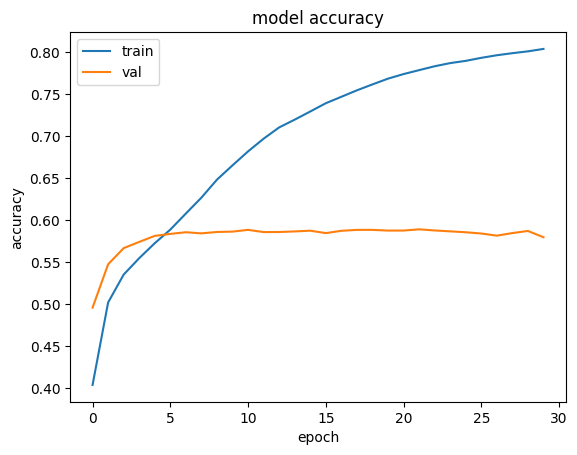

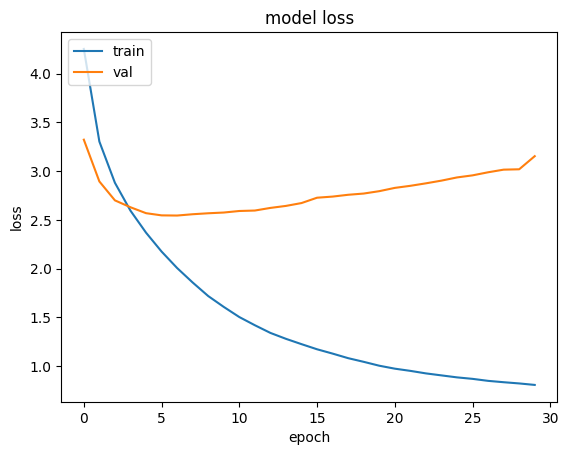

In [ ]:
#Plot accuracy and loss
from matplotlib import pyplot as plt

# Plot accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

#Plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper left')
plt.show()

In [ ]:
#Inference

In [ ]:
from tensorflow.keras.models import load_model
# Load the trained model
model = load_model(MODEL_PATH + 'vc_effnetB0_30_128.h5')
#best_model = load_model(MODEL_PATH + 'vc_resnet101_30_512_best_weights.h5')
# best_model = tf.keras.saving.load_model(
#     MODEL_PATH+'vc_effnetB0_75_128_best_weights.h5', custom_objects=None, compile=True, safe_mode=True)

In [ ]:
test_df.head(5)

,Unnamed: 0,original_text,video_id,eng_captions,nepali_captions
0,102,-8y1Q0rA3n8_95_102 a man with a sword runs and...,-8y1Q0rA3n8_95_102,a man with a sword runs ands stabs a cardboard...,तरवार बोकेको मानिस दौडन्छ र कार्डबोर्डको निशान...
1,103,-8y1Q0rA3n8_95_102 a man with a sword stabs a ...,-8y1Q0rA3n8_95_102,a man with a sword stabs a target,तरवार भएको मानिसले निशाना प्रहार गर्छ
2,104,-8y1Q0rA3n8_95_102 a man with a sword stabs a ...,-8y1Q0rA3n8_95_102,a man with a sword stabs a target,तरवार भएको मानिसले निशाना प्रहार गर्छ
3,105,-8y1Q0rA3n8_95_102 a man is stabbing a cardboa...,-8y1Q0rA3n8_95_102,a man is stabbing a cardboard cutout with a sword,एक जना मानिसले तरवारले कार्डबोर्ड कटआउटलाई छुर...
4,106,-8y1Q0rA3n8_95_102 a man stuck a sword through...,-8y1Q0rA3n8_95_102,a man stuck a sword through a piece of paper,एउटा मानिसले कागजको टुक्रामा तरवार हान्यो


In [ ]:
def generate_captions(model, feature, tokenizer, max_caption_length):
    if 'bos' not in tokenizer.word_index:
        raise KeyError("'bos' token is missing from the tokenizer.word_index dictionary.")
    if 'eos' not in tokenizer.word_index:
        raise KeyError("'eos' token is missing from the tokenizer.word_index dictionary.")

    # Initialize the decoder input with <bos> token
    decoder_input = np.zeros((1, 10, num_decoder_tokens))
    decoder_input[0, 0, tokenizer.word_index['bos']] = 1

    # Initialize the generated caption
    generated_caption = ''

    # Iterate until maximum caption length is reached or <eos> token is generated
    for i in range(1,max_caption_length-1):
        # Predict the next word in the caption
        predictions = model.predict([np.array([feature]), decoder_input])
        predicted_word_index = np.argmax(predictions[0, i-1, :])

        # Handle unknown word index
        if predicted_word_index not in tokenizer.index_word:
            predicted_word = '<unknown>'
        else:
            # Convert the predicted word index to the corresponding word
            predicted_word = tokenizer.index_word[predicted_word_index]

        # Break loop if <eos> token is generated
        if predicted_word == 'eos':
            break

        # Concatenate the predicted word to the generated caption
        generated_caption += predicted_word + ' '

        # Update the decoder input for the next iteration
        #decoder_input = np.zeros((1, 1, num_decoder_tokens))
        decoder_input[0, i, predicted_word_index] = i

    # Handle empty caption
    if generated_caption.strip() == '':
        generated_caption = '<empty>'

    return generated_caption.strip()


In [ ]:
v_id = valid_df['video_id'].iloc[50].strip()
print(v_id)
feature = extract_features(v_id+'.avi',model_cnn_load())
cap = generate_captions(model,feature,tokenizer,10)
print(cap)

-_hbPLsZvvo_49_55
21834768/21834768 [==============================] - 0s 0us/step
-_hbPLsZvvo_49_55
Processing video -_hbPLsZvvo_49_55.avi
-_hbPLsZvvo_49_55.avi
['/content/output/temporary_images/frame0.jpg', '/content/output/temporary_images/frame1.jpg', '/content/output/temporary_images/frame2.jpg', '/content/output/temporary_images/frame3.jpg', '/content/output/temporary_images/frame4.jpg', '/content/output/temporary_images/frame5.jpg', '/content/output/temporary_images/frame6.jpg', '/content/output/temporary_images/frame7.jpg', '/content/output/temporary_images/frame8.jpg', '/content/output/temporary_images/frame9.jpg', '/content/output/temporary_images/frame10.jpg', '/content/output/temporary_images/frame11.jpg', '/content/output/temporary_images/frame12.jpg', '/content/output/temporary_images/frame13.jpg', '/content/output/temporary_images/frame14.jpg', '/content/output/temporary_images/frame15.jpg', '/content/output/temporary_images/frame16.jpg', '/content/output/temporary_imag

In [ ]:
#!pip install keras-nlp --upgrade
!pip install rouge-score

  Preparing metadata (setup.py) ... done
  Created wheel for rouge-score: filename=rouge_score-0.1.2-py3-none-any.whl size=24934 sha256=bc85398d110fa56433b0aafe69e19720d9841c264a6f56f632de85325a8eab04
  Stored in directory: /root/.cache/pip/wheels/5f/dd/89/461065a73be61a532ff8599a28e9beef17985c9e9c31e541b4
Successfully built rouge-score


In [ ]:
import nltk
#import keras_nlp
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.meteor_score import meteor_score
from rouge_score import rouge_scorer
#from nltk.translate.cider_score import Cider
nltk.download('wordnet')
#keras_nlp.metrics.RougeL(use_stemmer=False, dtype=None, name="rouge-l")

# Function to evaluate the generated captions using BLEU, METEOR, and ROGUE metrics
def evaluate_metric(captions, references, hypothesis_ns):
    rouge1_scores = []
    rougeL_scores = []
    hypothesis = hypothesis_ns.split()
    bleu1 = sentence_bleu(references,hypothesis,weights=(1, 0, 0, 0))
    bleu2 = sentence_bleu(references,hypothesis,weights=(0.5, 0.5, 0, 0))
    bleu3 = sentence_bleu(references,hypothesis,weights=(0.33, 0.33, 0.33, 0))
    bleu4 = sentence_bleu(references,hypothesis,weights=(0.25, 0.25, 0.25, 0.25))
    meteor = meteor_score(references,hypothesis)
    scorer = rouge_scorer.RougeScorer(['rougeL'], use_stemmer=False)

    for i, reference in enumerate(captions):
        scores = scorer.score(reference.strip(), hypothesis_ns)
        rougeL_scores.append(scores['rougeL'].fmeasure)
        print(scores['rougeL'].fmeasure)

    avg_rougeL = np.mean(rougeL_scores)

    return bleu1, bleu2, bleu3, bleu4, meteor, avg_rougeL

def evaluate_captions(feat_dict, data_list,model, tokenizer, max_caption_length):
  bleu1_scores = []
  bleu2_scores = []
  bleu3_scores = []
  bleu4_scores = []
  meteor_scores = []
  roguel_scores = []

  # Convert list of lists to DataFrame
  data = pd.DataFrame(data_list, columns=["caption", "video_id"])
  data["caption"] = data["caption"].str.replace("bos ","")
  data["caption"] = data["caption"].str.replace(" eos","")

  for key, value in feat_dict.items():
    print(key)
    v_id = key.strip()+'.avi'
    feature = value
    captions = data.loc[data['video_id'] == key, 'caption'].tolist()
    references = [sentence.split() for sentence in captions]
    predicted_caption = generate_captions(model, feature, tokenizer, max_caption_length)
    bleu1, bleu2, bleu3, bleu4, meteor, rogue = evaluate_metric(captions,references,predicted_caption)
    bleu1_scores.append(bleu1)
    bleu2_scores.append(bleu2)
    bleu3_scores.append(bleu3)
    bleu4_scores.append(bleu4)
    meteor_scores.append(meteor)
    roguel_scores.append(rogue)
  # Calculate average scores
  avg_bleu1_score = np.mean(bleu1_scores)
  avg_bleu2_score = np.mean(bleu2_scores)
  avg_bleu3_score = np.mean(bleu3_scores)
  avg_bleu4_score = np.mean(bleu4_scores)
  avg_meteor_score = np.mean(meteor_scores)
  avg_roguel_score = np.mean(roguel_scores)

  return avg_bleu1_score, avg_bleu2_score, avg_bleu3_score, avg_bleu4_score, avg_meteor_score, avg_roguel_score



[nltk_data] Downloading package wordnet to /root/nltk_data...


In [ ]:
TEST_FEATURE_DIR = test_drive_path
test_ids = test_video_ids
print(len(test_ids))
test_feat = {}
for f_name in os.listdir(TEST_FEATURE_DIR):
    t_f = np.load(os.path.join(TEST_FEATURE_DIR, f_name))
    test_feat[f_name[:-4]] = t_f

197


In [ ]:
avg_bleu1_score, avg_bleu2_score, avg_bleu3_score, avg_bleu4_score, avg_meteor_score, avg_roguel_score =evaluate_captions(v_data,valid_list,model,tokenizer,10)
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))


-_hbPLsZvvo_269_275
1/1 [==============================] - 0s 221ms/step


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 3-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)
/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 4-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-_hbPLsZvvo_49_55
1/1 [==============================] - 0s 318ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-s4-6QTT7HE_235_241
1/1 [==============================] - 0s 213ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
-uT_1VDvXok_8_15


/usr/local/lib/python3.10/dist-packages/nltk/translate/bleu_score.py:552: UserWarning: 
The hypothesis contains 0 counts of 2-gram overlaps.
Therefore the BLEU score evaluates to 0, independently of
how many N-gram overlaps of lower order it contains.
Consider using lower n-gram order or use SmoothingFunction()
  warnings.warn(_msg)


Streaming output truncated to the last 5000 lines.
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
WTf5EgVY5uU_58_76
1/1 [==============================] - 0s 140ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
W_iR4YVCxUY_8_15
1/1 [==============================] - 0s 151ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
X4yzrIc072w_4_20
1/1 [==============================] - 0s 119ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
X7sQq-Iu1gQ_12_22
1/1 [==============================] - 0s 186ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
X_NLV2KCnIE_60_70
1/1 [==============================] - 0s 174ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
0
Y4BeJ-64294_20_30
1/1 [==============================] - 0s 149ms/step
0
0
0
0
0
0
0
0
0
0
0
0
0

In [ ]:
# effnetB0 gru 30 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.596464829586657
BLEU-2:  0.3816105951831896
BLEU-3:  0.17822356077106802
BLEU-4:  0.09251824186144973
METEOR:  0.43812039370902855
ROGUE-L:  0.0


In [ ]:
# effnetB0 gru 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.5754994482661683
BLEU-2:  0.3528475651784584
BLEU-3:  0.12773970836873735
BLEU-4:  0.07078782134939396
METEOR:  0.4132266530074039
ROGUE-L:  0.0


In [ ]:
# resnet101 gru 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.5232898235436306
BLEU-2:  0.2854699931127179
BLEU-3:  0.09057104954774631
BLEU-4:  0.058583617921609196
METEOR:  0.39092728990824527
ROGUE-L:  0.0


In [ ]:
# resnet101 gru 30 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.5348440899202321
BLEU-2:  0.3205947882052477
BLEU-3:  0.1137946946193028
BLEU-4:  0.09015145018097256
METEOR:  0.4106828977201351
ROGUE-L:  0.0


In [ ]:
# resnet 30 512 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.6504532269760696
BLEU-2:  0.43583447403642067
BLEU-3:  0.2096278294520388
BLEU-4:  0.1363576036879931
METEOR:  0.4924878279673485
ROGUE-L:  0.0


In [ ]:
# resnet 30 512 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))
print("ROGUE-L: ", str(avg_roguel_score))

BLEU-1:  0.6258278946096205
BLEU-2:  0.38060184173418304
BLEU-3:  0.15735561516171137
BLEU-4:  0.1001257957944501
METEOR:  0.4459360265528865
ROGUE-L:  0.0


In [ ]:
# resnet 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.5644972202078801
BLEU-2:  0.3347766542756304
BLEU-3:  0.15871609525326283
BLEU-4:  0.11920679112415745
METEOR:  0.43709651892111234


In [ ]:
# resnet 30 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6379260333575054
BLEU-2:  0.42856299695638184
BLEU-3:  0.24127683170004122
BLEU-4:  0.19438313645533026
METEOR:  0.5111256440490783


In [ ]:
# inception 60 128 validation
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.46247884940778344
BLEU-2:  0.24222175561110043
BLEU-3:  0.08753768716266998
BLEU-4:  1.3411964465223004e-78
METEOR:  0.3408320046931812


In [ ]:
# inception 60 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.44500846023688656
BLEU-2:  0.20416566035120082
BLEU-3:  0.07035007365122713
BLEU-4:  1.0751616561984607e-78
METEOR:  0.3109884248748661


In [ ]:
ince

In [ ]:
# inception 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

NameError: ignored

In [ ]:
# inception 30 128 valid
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.48972716156599005
BLEU-2:  0.23466270138151546
BLEU-3:  0.09727683664392917
BLEU-4:  1.5009815926427218e-78
METEOR:  0.38437668986696677


In [ ]:
# best model 9 128 effnet validation
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.677459511723471
BLEU-2:  0.45459311068198605
BLEU-3:  0.19212148261229173
BLEU-4:  0.12337439469370916
METEOR:  0.5028765319113084


In [ ]:
# best effnet model 9 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.643678913006491
BLEU-2:  0.4002049702453427
BLEU-3:  0.1429398141634167
BLEU-4:  0.08224093503457165
METEOR:  0.46591466717389524


In [ ]:
# Print scores - effBO 30 128 test
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6261924362433089
BLEU-2:  0.4035675644506362
BLEU-3:  0.19982786400076272
BLEU-4:  0.1362589230784423
METEOR:  0.4669357275979188


In [ ]:
# Print scores - effBO 30 128 validation
print("BLEU-1: ", str(avg_bleu1_score))
print("BLEU-2: ", str(avg_bleu2_score))
print("BLEU-3: ", str(avg_bleu3_score))
print("BLEU-4: ", str(avg_bleu4_score))
print("METEOR: ", str(avg_meteor_score))

BLEU-1:  0.6543359279991056
BLEU-2:  0.4366298374823812
BLEU-3:  0.24527687999450165
BLEU-4:  0.16259176767640962
METEOR:  0.5024307512290213


In [ ]:

##################################################################################################